## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Import all necessary packages

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import os
import pickle

%matplotlib inline

## Define variables

In [2]:
folder_output_images = './output_images/'
folder_test_images = './test_images/'
test_image_name = 'test8' #'test4'
folder_camera_cal = './camera_cal/'

project_video_filename = 'project_video.mp4'

# plot figure size
def_figsize = (20, 40)

# camera calibration
g_mtx = None
g_dist = None

# minimum_radius of curvature
min_rad_curv = 180 # meters

## Line class to store detected lines

In [3]:
##############################################################################
# LINE CLASS TO STORE DATA
##############################################################################
##############################################################################
# 
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None


## Make two instances of the Line class for left and right

In [4]:
left_line = Line()
right_line = Line()

## Camera calibration and undistort

In [5]:
##############################################################################
# CAMERA CALIBRATION
##############################################################################
##############################################################################
# Get obj and img points
def get_object_image_points(nx, ny, img_path):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    
    # Make a list of calibration images
    images = glob.glob(img_path)
    col = 2
    row = len(images)//col
    fig, axs = plt.subplots(row, col, figsize=def_figsize)
    fig.subplots_adjust(hspace = 0.3, wspace=0.001)
    axs = axs.ravel()
    
    # Step through the list and search for chessboard corners
    for i, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
    
        path, filename = os.path.split(fname)
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    
            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            #cv2.imshow('img',img)
            #cv2.waitKey(500)
            axs[i].imshow(img)
            axs[i].set_title(filename)
        else:
            img = np.zeros_like(img)
            axs[i].imshow(img)
            axs[i].set_title(filename)
    return objpoints, imgpoints
        
##############################################################################
# Camera calibration
def calibrate_camera(nx, ny, img_size, img_path, cal_path, overwrite=True):
    
    if overwrite == False & os.path.isfile(cal_path):
        return load_camera_calibration(cal_path) #None, None
    
    objpoints, imgpoints = get_object_image_points(nx, ny, img_path)
    _, mtx, dist, _, _ = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    dist_pickle = {}
    dist_pickle['mtx'] = mtx
    dist_pickle['dist'] = dist
    pickle.dump(dist_pickle, open(cal_path, 'wb'))
    return mtx, dist
    
def load_camera_calibration(cal_path):
    dist_pickle = pickle.load(open(cal_path, 'rb'))
    return dist_pickle['mtx'], dist_pickle['dist']

def undistort_image(img_path, cal_path):
    img = cv2.imread(img_path)
    mtx, dist = load_camera_calibration(cal_path)
    return img, cv2.undistort(img, mtx, dist, None, mtx)


## Thresholds

In [6]:
##############################################################################
# THRESHOLDS
##############################################################################
##############################################################################
# 
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    #plt.imshow(sbinary, cmap='gray')
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    binary_output = sbinary
    return binary_output

##############################################################################
# 
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale = np.max(mag)/255
    mag = (mag/scale).astype(np.uint8)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(mag)
    binary_output[(mag >= thresh[0]) & (mag <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output

##############################################################################
# 
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction)
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    binary_output[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return binary_output
        

##############################################################################
# 
# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_thresh(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    s = hls[:,:,2]
    binary_output = np.zeros_like(s)
    binary_output[(s > thresh[0]) & (s <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    #binary_output = np.copy(img) # placeholder line
    return binary_output

##############################################################################
# 
def select_yellow(image):
    #hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([20,100,100]) #[20,60,60])
    upper = np.array([30,255,255]) #38,174, 250])
    binary_output = cv2.inRange(hsv, lower, upper)

    return binary_output

##############################################################################
# 
def select_white(image):
    lower = np.array([202,202,202])
    upper = np.array([255,255,255])
    binary_output = cv2.inRange(image, lower, upper)

    return binary_output    


## Pipeline with fine tuned parameters

In [7]:
##############################################################################
# PIPELINE
##############################################################################
##############################################################################
# 
sobel_thresh_value = (30, 255)
mag_thresh_value = (50, 255)
dir_thresh_value = (0.7, 1.04)
hls_thresh_value = (150, 255)

# Edit this function to create your own pipeline.
def pipeline(image):
    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements
    
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=sobel_thresh_value)
#    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=sobel_thresh_value)
#    mag_binary = mag_thresh(image, sobel_kernel=ksize, thresh=mag_thresh_value)
    dir_binary = dir_thresh(image, sobel_kernel=ksize, thresh=dir_thresh_value)
    
    hls_binary = hls_thresh(image, hls_thresh_value)
    
    white = select_white(image)
    yellow = select_white(image)
    
    combined = np.zeros_like(hls_binary)
#    combined[((gradx == 1) & (grady == 1)) 
#                | ((mag_binary == 1) & (dir_binary == 1)) 
#                | (hls_binary == 1)
#                | (white == 1) 
#                | (yellow == 1)] = 1
    
    combined[#((gradx == 1) & (grady == 1)) 
#            (mag_binary == 1)  
                (gradx == 1)
                | ((hls_binary == 1) & (dir_binary == 1))
                | (white == 1) 
                | (yellow == 1)] = 1
    return combined
        


## Transform perspective with the warper function

In [8]:
##############################################################################
# TRANSFORM
##############################################################################
##############################################################################
# 
def warper(img, src, dst):

    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

def get_warp_dst_coord(img_size):
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
        
    return dst

def get_src_dst_for_transform(img):
    
    h, w = img.shape[:2]
    img_size = (w, h)
    
    src = np.float32(
#        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [[(img_size[0] / 2) - 50, img_size[1] / 2 + 90],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
#        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
        [(img_size[0] / 2 + 50), img_size[1] / 2 + 90]])
    
    dst = get_warp_dst_coord(img_size)

    return src, dst

def transform_perspective(img):
    src, dst = get_src_dst_for_transform(img)    
    return warper(img, src, dst)
    

## Find lines

### Use sliding_window with no previous lines

In [9]:
##############################################################################
# SLIDING WINDOWS AND FIT A POLYNOMIAL
##############################################################################
##############################################################################
#
def sliding_window(binary_warped, plot=True):

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Visualize the data
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Check sanity of detected lanes
    # if the distance between left and right is too far, ignore the detection
    found = True
    dst = get_warp_dst_coord((binary_warped.shape[1], binary_warped.shape[0]))
    max_dist = (dst[2][0] - dst[1][0]) + margin*2
    if ((rightx[-1] - leftx[-1]) > max_dist):
        found = False

    if plot:
        img_size = (out_img.shape[1], out_img.shape[0])
        plt.figure(figsize=def_figsize) # open a new window
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, img_size[0])
        plt.ylim(img_size[1], 0)

    return out_img, left_fit, right_fit, found


### Use find_lines when previous lines are available

In [10]:
def find_lines(binary_warped, left_fit, right_fit, plot=True):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Visualize it
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    if plot:
        img_size = (out_img.shape[1], out_img.shape[0])
        plt.figure(figsize=def_figsize) # open a new window
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, img_size[0])
        plt.ylim(img_size[1], 0)
    
    return result, left_fit, right_fit

## Curvature

In [11]:
##############################################################################
# CURVATURE
##############################################################################
##############################################################################
# 
def get_curvature(binary_warped, left_fit, right_fit):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    #left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    #right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)
    
    # Calcuate vehicle's distance from the center
    # assuming the car position is the center of the image
    car_center = binary_warped.shape[1] // 2
    lane_center = (left_fitx[int(y_eval)] + right_fitx[int(y_eval)]) / 2
    dist_center = (car_center - lane_center)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad_m = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad_m = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    dist_center_m = dist_center * xm_per_pix
    return left_curverad_m, right_curverad_m, dist_center_m


## Draw functions for detected lines

In [12]:
##############################################################################
# DRAW DETECTED LINES AND THEIR INFO
##############################################################################
##############################################################################
# 
def draw_lanes(image, binary_warped, left_fit, right_fit):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
     # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # calcuate m_inv
    src, dst = get_src_dst_for_transform(image)
    m_inv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, m_inv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    return result

def draw_lanes_info(image, left_curv, right_curv, dist_center, plot=True):
    #avg_curv = (left_curv + right_curv)/2
    direction = 'left' if dist_center < 0 else 'right'
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    bottomLeftCornerOfText = (20, 50)
    fontScale = 1
    fontColor = (255,255,255) # white
    lineType = 2 #cv2.LINE_AA

    text = 'Radii of Left and Right Curvature = {}, {} (m)'.format(int(left_curv), int(right_curv))
    cv2.putText(image, text, bottomLeftCornerOfText, font, fontScale, 
                fontColor, lineType)
    
    bottomLeftCornerOfText = (20, 80)
    text = 'Vehicle is {:.2f}m '.format(abs(dist_center))+direction+' of center'
    cv2.putText(image, text, bottomLeftCornerOfText, font, fontScale, 
                fontColor, lineType)

    if plot:
        plt.figure(figsize=def_figsize) # open a new window
        img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
    else:
        img = image
        
    return img

## Some utility functions to save time

In [13]:
##############################################################################
# UTILITIES
##############################################################################
##############################################################################
# 
def plot_side_by_side(org_img, processed_img, processed_title, gray=False, save=True):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=def_figsize)
    #f.tight_layout()
    ax1.imshow(cv2.cvtColor(org_img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=12)
    if (gray):
        ax2.imshow(processed_img, cmap='gray')
    else:
        processed_img = cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB)
        ax2.imshow(processed_img)
        
    ax2.set_title(processed_title, fontsize=12)

    if (save == True):    
        save_image(processed_title, processed_img, gray)

# image is expected as RGB format    
def save_image(name, image, gray=False):
    name = name.replace(" ", "_")
    fname = folder_output_images + name + '.png'
    #cv2.imwrite(fname, image)
    if (gray):
        plt.imsave(fname, image, cmap=plt.cm.gray)
        return
    else:
        plt.imsave(fname, image) # cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    #print(fname)


## Video processing

In [14]:
##############################################################################
# VIDEO PROCESSING
##############################################################################
##############################################################################
# 
# Assuming camera calibration is done so g_mtx and g_dist are available
def process_image(img):
    global left_line, right_line
    
    image = cv2.undistort(img, g_mtx, g_dist, None, g_mtx)

    combined_binary = pipeline(image)
    processed = transform_perspective(combined_binary)
    
    if left_line.detected and right_line.detected:
        rgb, left_fit, right_fit = find_lines(processed, left_line.best_fit, right_line.best_fit, plot=False)
        #save_image(test_image_name+' Find lines from prev left and right', rgb, gray=False)    

        left_line.best_fit = left_fit
        right_line.best_fit = right_fit
    else:        
        rgb, left_fit, right_fit, found = sliding_window(processed, plot=False)
        if found == False: # failed to find proper left and right lanes
            left_fit = left_line.best_fit #if left_line.best_fit != None else [0,0,0]
            right_fit = right_line.best_fit #if right_line.best_fit != None else [0,0,0]
            #save_image(test_image_name+' Sliding Window', rgb, gray=False)    
            left_line.detected = False
            right_line.detected = False
        else:
            #save_image(test_image_name+' Sliding Window', rgb, gray=False)    
            left_line.detected = True
            right_line.detected = True

            left_line.best_fit = left_fit
            right_line.best_fit = right_fit
    
    left_curv, right_curv, dist_center = get_curvature(processed, left_fit, right_fit)
    # note that the radius of cuvature values here are metrics.
    # curvature sanity check 
    # 1. too sharp turn
    if ((left_curv < min_rad_curv) or (right_curv < min_rad_curv)):
        left_line.detected = False
        right_line.detected = False
        # use the prev ones to draw lanes
        if (left_line.radius_of_curvature != None):
            left_curv = left_line.radius_of_curvature
            left_fit = left_line.best_fit
        else:
            left_curv = min_rad_curv
            left_fit = left_line.best_fit
            
        if (left_line.radius_of_curvature != None):
            right_curv = right_line.radius_of_curvature
            right_fit = right_line.best_fit
        else:
            right_curv = min_rad_curv
            right_fit = right_line.best_fit

    # curvature sanity check
    # 2. two detected lanes are not parallel
    #    one line is too much curvy compared to the other
    if left_curv < 1000 and right_curv < 1000:
        if abs(left_curv - right_curv) > 200:
            left_line.detected = False
            right_line.detected = False
            if left_curv > right_curv:
                right_curv = left_curv
                right_fit = right_line.best_fit
            else:
                left_curv = right_curv
                left_fit = left_line.best_fit
    
    left_line.radius_of_curvature = left_curv
    right_line.radius_of_curvature = right_curv
    
    img_lanes = draw_lanes(image, processed, left_fit, right_fit)
    img_out = draw_lanes_info(img_lanes, left_curv, right_curv, dist_center, plot=False)
    #save_image(test_image_name+' Radius of Curvature and Vehicle Position', rgb, gray=False)
    
    return img_out
        
from moviepy.editor import VideoFileClip

def process_video(src_file_path):
    base = os.path.basename(src_file_path)
    dst_file_path = os.path.splitext(base)[0] + '_processed.mp4'
    src_movie = VideoFileClip(src_file_path, audio=False)
#    src_movie = VideoFileClip(src_file_path, audio=False).subclip(36,43)
    dst_movie = src_movie.fl_image(process_image)
    dst_movie.write_videofile(dst_file_path)


## Test functions to verify the image processing steps
All test images were used in the 'test_images' folder.

In [15]:
##############################################################################
# TEST FUNCTIONALITIES
##############################################################################
##############################################################################
# 
def test_thresholds(image):    
    ##########################################################################
    # test threshold
    #print('Test all thresholds')
   
    gradx_binary = abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=sobel_thresh_value)
    plot_side_by_side(image, gradx_binary, 'Thresholded X Gradient', gray=True)

    grady_binary = abs_sobel_thresh(image, orient='y', sobel_kernel=3, thresh=sobel_thresh_value)
    plot_side_by_side(image, grady_binary, 'Thresholded Y Gradient', gray=True)
    
    mag_binary = mag_thresh(image, sobel_kernel=3, thresh=mag_thresh_value)
    plot_side_by_side(image, mag_binary, 'Thresholded Magnitude', gray=True)

    dir_binary = dir_thresh(image, sobel_kernel=15, thresh=dir_thresh_value)
    plot_side_by_side(image, dir_binary, 'Thresholded Grad. Dir.', gray=True)
    
    hls_binary = hls_thresh(image, thresh=hls_thresh_value)
    plot_side_by_side(image, hls_binary, 'HLS Threshold (S channel)', gray=True)

    yellow_binary = select_yellow(image)
    plot_side_by_side(image, yellow_binary, 'Select Yellow', gray=True)

    white_binary = select_white(image)
    plot_side_by_side(image, white_binary, 'Select White', gray=True)

def test_combined_thresholds():

    ###########################################################################
    # Test combined thresholds with test images
    #print('Test the pipeline with test images')
    files = glob.glob(folder_test_images+'*.jpg')
    
    fig, axs = plt.subplots(len(files), 2, figsize=def_figsize)
    fig.subplots_adjust(hspace = 0.3, wspace=0.001)
    axs = axs.ravel() 
    i = 0
    for fname in files:
        img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
        axs[i].imshow(img)
        axs[i].set_title(fname)
        i += 1
        processed = pipeline(img)
        axs[i].imshow(processed, cmap='gray')
        base = os.path.basename(fname)
        title = 'Combined Threshold-' + os.path.splitext(base)[0]
        axs[i].set_title(title)
        i += 1
        save_image(title, processed, gray=True)
        
def test_perspective_transform():
       
    ##########################################################################
    ###########################################################################
    # Test perspective transform
    files = glob.glob(folder_test_images+'*.jpg')
    
    fig, axs = plt.subplots(len(files), 2, figsize=def_figsize)
    fig.subplots_adjust(hspace = 0.3, wspace=0.001)
    axs = axs.ravel() 
    i = 0
      
    for fname in files:
        base = os.path.basename(fname)

        img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
        src, dst = get_src_dst_for_transform(img)
        x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
        y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
        img_org = np.copy(img)
        for n in range(4):
            cv2.line(img, (x[n], y[n]), (x[n+1], y[n+1]), (255,0,0), 5)
        axs[i].imshow(img)
        title = 'Original-' + os.path.splitext(base)[0]
        axs[i].set_title(title)
        save_image(title, img)

        i += 1

        processed = transform_perspective(img_org)
        x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
        y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]
        for n in range(4):
            cv2.line(processed, (x[n], y[n]), (x[n+1], y[n+1]), (255,0,0), 5)
        axs[i].imshow(processed)
        title = 'Transformed-' + os.path.splitext(base)[0]
        axs[i].set_title(title)
        save_image(title, processed)

        i += 1

def test_find_lanes():
    ###########################################################################
    # Test fine lanes with test images
    #print('Test the pipeline with test images')
    files = glob.glob(folder_test_images+'*.jpg')
    
    fig, axs = plt.subplots(len(files), 3, figsize=def_figsize)
#    fig, axs = plt.subplots(len(files), 3, figsize=def_figsize)
    fig.subplots_adjust(hspace = 0.3, wspace=0.001)
    axs = axs.ravel() 
    i = 0
    
    for fname in files:
        base = os.path.basename(fname)

        img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
        axs[i].imshow(img)
        axs[i].set_title(fname)
        i += 1

        combined_binary = pipeline(img)
        processed = transform_perspective(combined_binary)
        rgb, left_fit, right_fit, found = sliding_window(processed, plot=False)
        title = 'Sliding Window-' + os.path.splitext(base)[0]
        save_image(title, rgb, gray=False)    
        # plot
        axs[i].imshow(rgb)
        axs[i].set_title(title)
        i += 1
        
#        rgb, left_fit, right_fit = find_lines(processed, left_fit, right_fit, plot=False)
#        title = 'Find Lanes with Prev-' + os.path.splitext(base)[0]
#        save_image(title, rgb, gray=False)    
#        # plot
#        axs[i].imshow(rgb)
#        axs[i].set_title(title)
#        i += 1
        
        left_curv, right_curv, dist_center = get_curvature(processed, left_fit, right_fit)
        img_lanes = draw_lanes(img, processed, left_fit, right_fit)
        rgb = draw_lanes_info(img_lanes, left_curv, right_curv, dist_center, plot=False)
        title = 'Curv and Dist-' + os.path.splitext(base)[0]
        save_image(title, rgb, gray=False)
        # plot
        axs[i].imshow(rgb)
        axs[i].set_title(title)
        i += 1



## Main function

In [16]:
def main():
    global g_mtx, g_dist
    
    nx = 9
    ny = 6
    cal_img_path = folder_camera_cal+'calibration*.jpg'
    cal_path = 'camera_calibration.p'
    cal_test_img_path = folder_camera_cal+'calibration1.jpg'
    
    ##########################################################################
    # calibrate camera
    #print('Calibrate camera')
    img = cv2.imread(cal_test_img_path)
    img_size = (img.shape[1], img.shape[0])
    g_mtx, g_dist = calibrate_camera(nx, ny, img_size, cal_img_path, cal_path, True)
    #g_mtx, g_dist = calibrate_camera(nx, ny, img_size, cal_img_path, cal_path, False)
    
    ##########################################################################
    # undistort image - test with chessboard
    #print('Undistort a chessboard image')
    org, undist = undistort_image(cal_test_img_path, cal_path)
    # visualize undistortion
    plot_side_by_side(org, undist, 'Undistorted Image')
 
    ##########################################################################
    #
    #print('Undistort a test image')
    cal_test_img_path = folder_test_images+test_image_name+'.jpg'
    # example of a distortion-corrected image
    org, undist = undistort_image(cal_test_img_path, cal_path)
    # visualize undistortion
    plot_side_by_side(org, undist, test_image_name+' Undistorted')
    # test all threshold
    test_thresholds(undist)
    # test combined threshold
    combined_binary = pipeline(undist)
    plot_side_by_side(undist, combined_binary, test_image_name+' Combined Thresholds', gray=True)


    ###########################################################################
    # TEST WITH TEST IMAGES
    ###########################################################################
    # 
    test_combined_thresholds()

    ###########################################################################
    # 
    test_perspective_transform()        

    ###########################################################################
    # 
    test_find_lanes()
    
    ###########################################################################
    # pipeline (video)
    process_video(project_video_filename)



## To run the main
Run the cell below.

[MoviePy] >>>> Building video project_video_processed.mp4
[MoviePy] Writing video project_video_processed.mp4


100%|█████████▉| 1260/1261 [08:05<00:00,  2.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_processed.mp4 



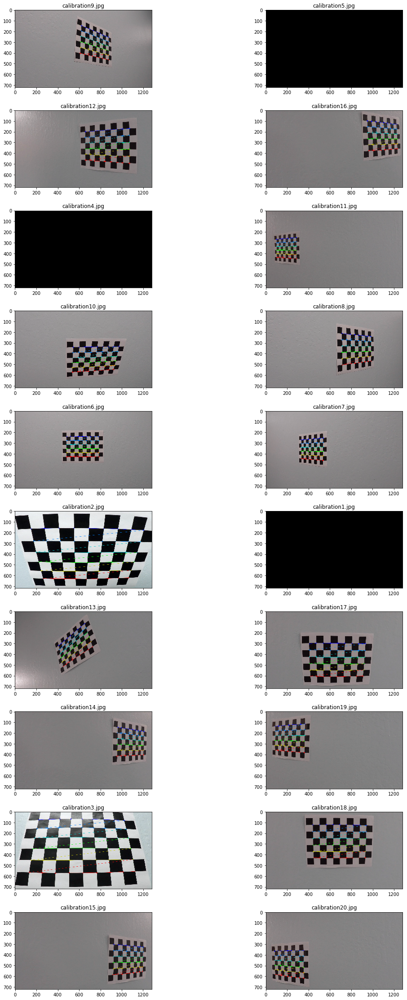

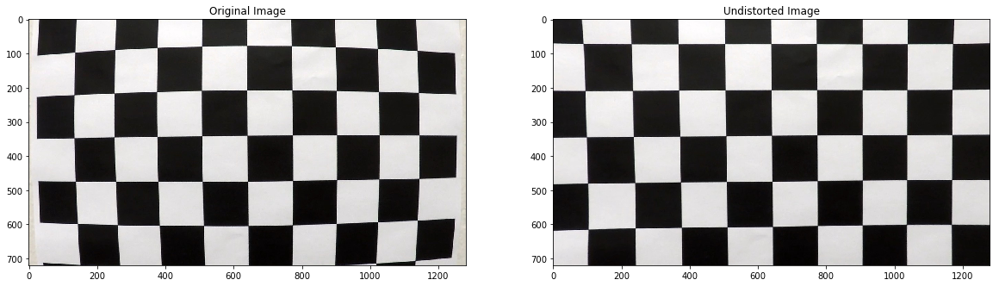

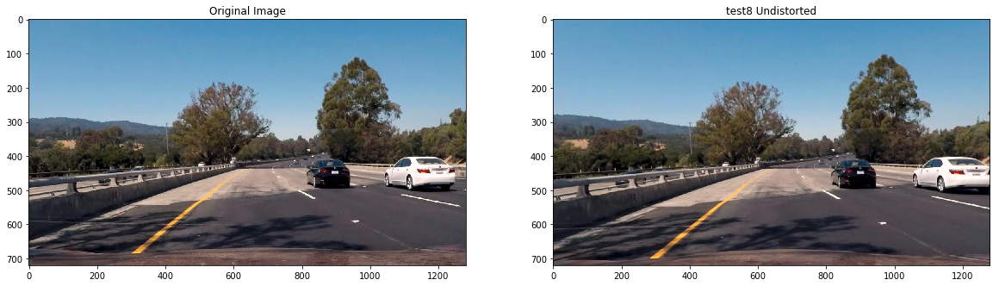

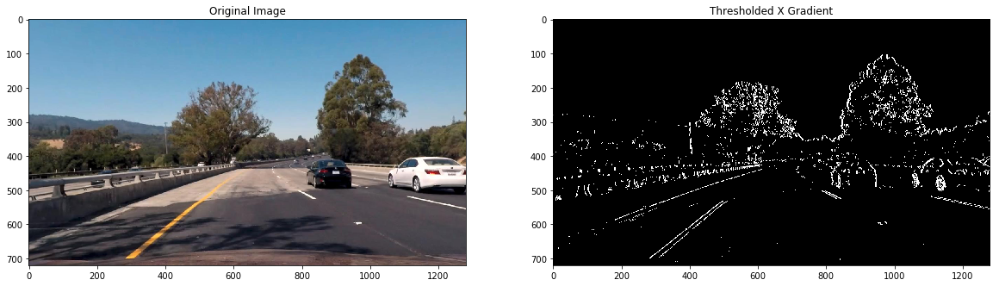

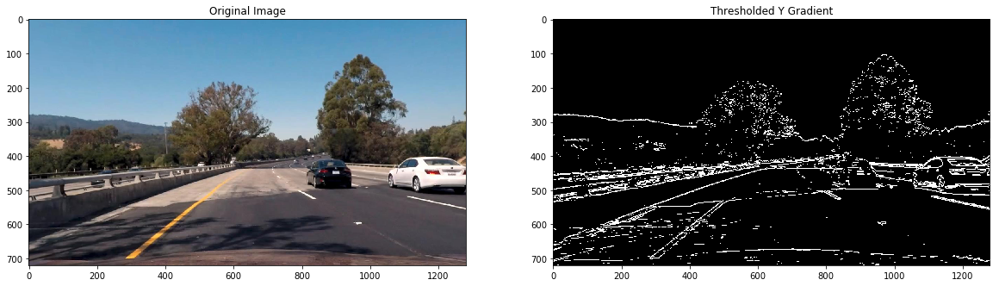

...

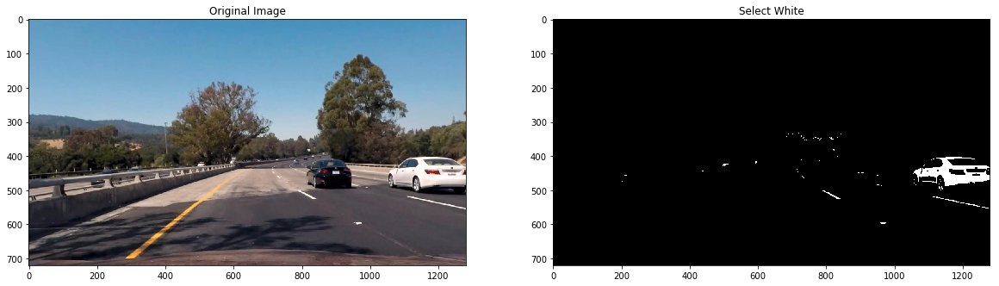

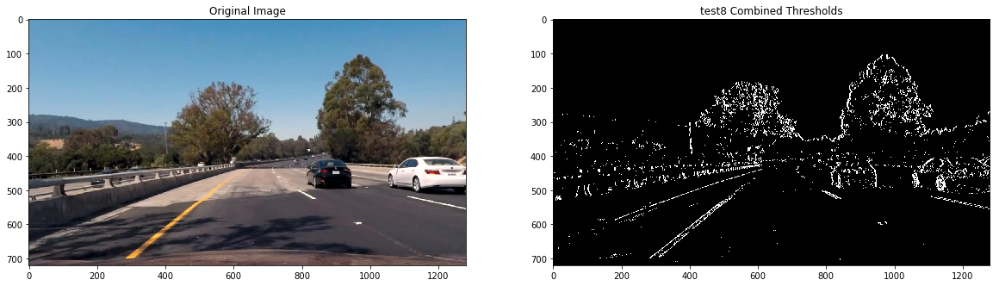

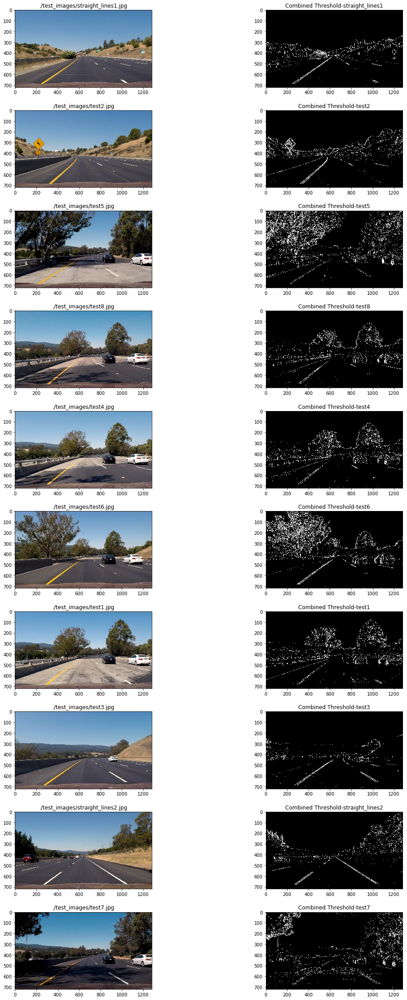

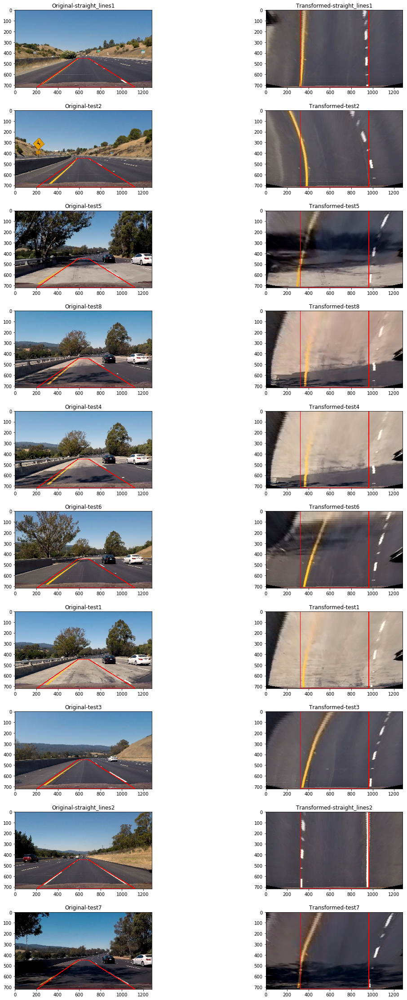

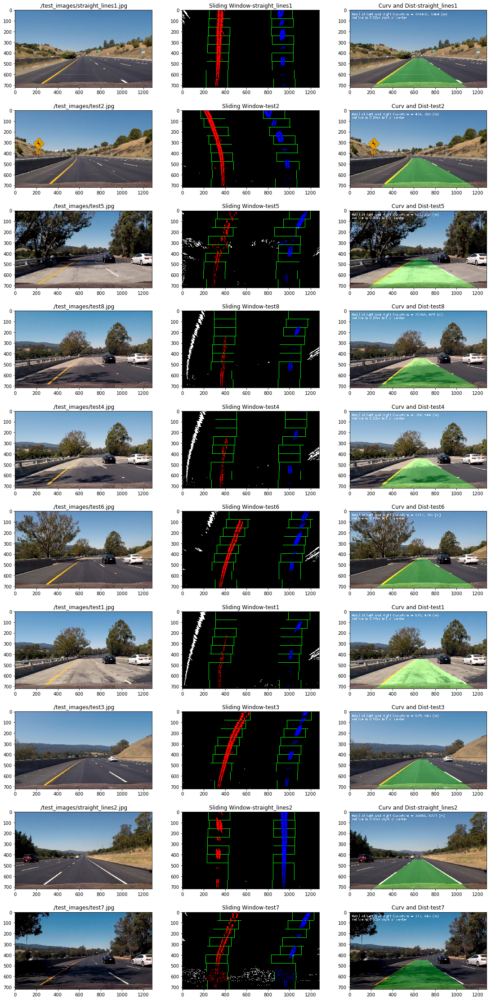

In [17]:
if __name__ == '__main__':
    main()